In [235]:
import math
import torch
import gpytorch
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt


from GPyEm import GPE_ensemble as GPE

import os
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
#from GPErks.gp.data.dataset import Dataset
from gpytorch.likelihoods import GaussianLikelihood
from gpytorch.means import LinearMean
from gpytorch.kernels import RBFKernel, ScaleKernel
from torchmetrics import MeanSquaredError, R2Score
#from GPErks.gp.experiment import GPExperiment
#from GPErks.train.emulator import GPEmulator
#from GPErks.perks.inference import Inference
#from GPErks.train.early_stop import NoEarlyStoppingCriterion
#from GPErks.train.early_stop import (
#    GLEarlyStoppingCriterion,
#    PQEarlyStoppingCriterion,
#    UPEarlyStoppingCriterion,
#)
#from GPErks.train.early_stop import PkEarlyStoppingCriterion



%matplotlib inline
%load_ext autoreload
%autoreload 2

# set logger and enforce reproducibility
#from GPErks.log.logger import get_logger
#from GPErks.utils.random import set_seed
#log = get_logger()
seed = 7
#set_seed(seed)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [236]:
mesh=47
y_val = torch.tensor([147])

In [237]:
x_labels=pd.read_csv(r'/Users/pmzcwl/Library/CloudStorage/OneDrive-TheUniversityofNottingham/shared_simulations/mechanics/scenario_'+str(mesh)+'/xlabels.txt',delim_whitespace=True,header=None)


X_all = pd.read_csv(r'/Users/pmzcwl/Library/CloudStorage/OneDrive-TheUniversityofNottingham/shared_simulations/mechanics/scenario_'+str(mesh)+'/X.txt',index_col=None,delim_whitespace=True,header=None)
X_all.columns=x_labels.values.squeeze().tolist()
print(X_all)

mask = pd.read_csv(r'/Users/pmzcwl/Library/CloudStorage/OneDrive-TheUniversityofNottingham/shared_simulations/mechanics/scenario_'+str(mesh)+'/output_mask_beat_5.txt',index_col=None,delim_whitespace=True,header=None)


        PCa_b   trpnmax    Gncx_b     Tref    perm50    nperm   TRPN_n  \
0    0.000122  0.079681  0.001599  175.127  0.194890  2.76968  2.59449   
1    0.000094  0.089178  0.001334  174.341  0.388696  2.03769  2.94509   
2    0.000128  0.075311  0.001740  179.916  0.245876  2.36111  2.92207   
3    0.000142  0.122175  0.002428  198.270  0.408520  2.86864  2.84040   
4    0.000095  0.110494  0.001329  165.397  0.282575  2.88664  2.31923   
..        ...       ...       ...      ...       ...      ...      ...   
795  0.000093  0.118370  0.001163  184.647  0.283320  2.99653  2.46956   
796  0.000091  0.079472  0.000975  198.891  0.456715  3.01241  2.07730   
797  0.000147  0.087607  0.001378  195.996  0.213886  2.51946  2.80751   
798  0.000151  0.116453  0.001457  192.469  0.372302  2.74916  2.55940   
799  0.000112  0.073569  0.001336  170.032  0.322520  1.91660  2.91944   

           dr     wfrac    TOT_A  ...    AoPref    PaPref     VePref  \
0    0.200250  0.295068  17.5391  ...  

In [238]:
x_labels

,0
0,PCa_b
1,trpnmax
2,Gncx_b
3,Tref
4,perm50
5,nperm
6,TRPN_n
7,dr
8,wfrac
9,TOT_A


In [239]:
y_labels=pd.read_csv(r'/Users/pmzcwl/Library/CloudStorage/OneDrive-TheUniversityofNottingham/shared_simulations/mechanics/scenario_47/ylabels.txt',delim_whitespace=True,header=None)


y_all = pd.read_csv(r'/Users/pmzcwl/Library/CloudStorage/OneDrive-TheUniversityofNottingham/shared_simulations/mechanics/scenario_'+str(mesh)+'/Y.txt',index_col=None,delim_whitespace=True,header=None)
y_all.columns=y_labels.values.squeeze().tolist()
print(y_all)

      LVedv  LVedp  LVesv  LVpMax  LVdpdtMax  LVdpdtMin   RVedv  RVedp  RVesv  \
0    126.12  14.48  51.71  190.91       1903      -1004  147.49  15.05  71.91   
1    130.59  14.97  77.74  181.83       3228      -1233  122.13   9.85  67.22   
2    140.46  18.09  67.39   91.30       1718       -817  147.21  22.19  73.38   
3    118.50  21.02  46.92  104.71       2466       -914  149.78  18.21  73.46   
4    102.87  11.39  49.72  116.54       3174       -942  143.04  15.92  75.00   
..      ...    ...    ...     ...        ...        ...     ...    ...    ...   
463  106.63  10.96  58.29  132.62       3055      -1148  122.17   8.70  70.65   
464  105.90   3.08  54.81   84.91       1900       -674  112.90   6.27  67.26   
465  105.68   8.44  60.13  138.82       2895      -1162  126.60   7.22  77.32   
466  122.44  12.91  52.91  157.35       2502       -836  155.26  13.75  85.02   
467  119.64   6.94  67.74  119.05       3009       -947  129.19   9.95  71.27   

     RVpMax  ...  RAvMax  R

# Emulator

In [240]:
y_all.max()

LVedv         158.530
LVedp          32.430
LVesv          91.260
LVpMax        260.870
LVdpdtMax    4852.000
LVdpdtMin    -289.000
RVedv         191.360
RVedp          33.040
RVesv         106.360
RVpMax         92.390
RVdpdtMax    1379.000
RVdpdtMin     -68.000
LAedv          61.830
LAesv          55.590
LAvMax         81.810
LApMax         32.340
RAedv          68.850
RAesv          58.200
RAvMax         86.220
RApMax         31.790
LAsvA          16.710
LAinflV        22.810
LAsvV          22.880
RAsvA          21.880
RAinflV        20.390
RAsvV          21.400
A_TAT         166.789
V_TAT         110.775
dtype: float64

In [241]:
input_masked = X_all.copy().iloc[0:mask.shape[0]]

input_masked=input_masked.iloc[np.array(mask==1),]

In [242]:
input_masked

,PCa_b,trpnmax,Gncx_b,Tref,perm50,nperm,TRPN_n,dr,wfrac,TOT_A,...,AoPref,PaPref,VePref,kArt,a_ventricles,a_atria,k_peri,Tref_lvrv,EDP_lv,EDP_rv
2,0.000128,0.075311,0.001740,179.916,0.245876,2.36111,2.92207,0.178430,0.363202,26.0661,...,131.4830,39.3790,8.96592,5.39047,2.28376,1.69743,0.002596,0.932621,14.58400,6.56783
3,0.000142,0.122175,0.002428,198.270,0.408520,2.86864,2.84040,0.307598,0.708652,20.4240,...,137.4090,60.3757,22.24320,10.80210,2.96033,5.82476,0.020070,0.995065,14.09110,6.32621
6,0.000126,0.108006,0.001234,183.942,0.386847,2.74360,2.80531,0.324396,0.473581,33.0962,...,82.2075,60.4809,18.61070,5.23605,2.85366,4.59552,0.027404,0.901970,9.03667,7.22786
7,0.000141,0.101289,0.001261,191.848,0.379215,2.71667,2.75931,0.274772,0.575894,26.7925,...,105.1700,66.7100,16.43940,6.88459,3.95044,5.51921,0.004023,0.669942,24.31300,4.79645
12,0.000150,0.092182,0.001304,161.633,0.177513,2.41762,2.98397,0.185483,0.573994,21.6849,...,120.4910,24.4867,9.23900,6.04995,3.95538,5.39593,0.012989,0.760287,23.99770,5.51574
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
790,0.000114,0.084102,0.001770,162.267,0.233689,2.94658,2.81168,0.219835,0.510989,22.2423,...,108.0970,15.5498,12.46390,7.75086,3.88496,5.38463,0.017253,0.729674,23.89120,6.84043
791,0.000129,0.072670,0.001974,160.336,0.213131,2.26656,2.67570,0.209687,0.454325,26.7747,...,92.5784,17.7477,2.59878,6.63185,3.01672,4.54503,0.001023,0.604076,11.25450,6.51976
793,0.000145,0.085312,0.001811,168.324,0.348267,2.91784,2.58528,0.241320,0.610540,34.6599,...,130.8510,30.2307,4.30013,5.10636,4.60597,4.03068,0.009480,0.893738,23.40350,4.12344
794,0.000119,0.068411,0.001641,183.701,0.388530,2.30809,2.77711,0.228645,0.647086,15.4487,...,135.0010,23.9818,21.66380,5.46297,1.31755,5.16810,0.028486,0.826869,10.87630,4.15926


In [243]:
y_all

,LVedv,LVedp,LVesv,LVpMax,LVdpdtMax,LVdpdtMin,RVedv,RVedp,RVesv,RVpMax,...,RAvMax,RApMax,LAsvA,LAinflV,LAsvV,RAsvA,RAinflV,RAsvV,A_TAT,V_TAT
0,126.12,14.48,51.71,190.91,1903,-1004,147.49,15.05,71.91,65.32,...,69.47,14.85,13.41,9.87,9.93,18.94,8.75,11.33,126.700,90.6829
1,130.59,14.97,77.74,181.83,3228,-1233,122.13,9.85,67.22,49.67,...,64.42,9.55,5.80,7.82,7.74,6.11,8.20,8.68,131.971,90.2363
2,140.46,18.09,67.39,91.30,1718,-817,147.21,22.19,73.38,50.45,...,70.21,21.87,3.91,16.72,16.66,5.73,9.97,10.19,150.992,106.3080
3,118.50,21.02,46.92,104.71,2466,-914,149.78,18.21,73.46,49.76,...,68.95,17.76,6.05,9.89,9.64,7.54,7.62,9.35,121.213,93.5512
4,102.87,11.39,49.72,116.54,3174,-942,143.04,15.92,75.00,43.76,...,68.49,15.43,4.63,8.17,7.70,7.34,7.89,9.48,150.880,88.6315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
463,106.63,10.96,58.29,132.62,3055,-1148,122.17,8.70,70.65,28.99,...,63.91,7.93,4.41,6.91,6.81,5.17,7.19,8.39,161.630,87.6374
464,105.90,3.08,54.81,84.91,1900,-674,112.90,6.27,67.26,36.07,...,56.99,6.99,11.09,3.35,3.69,14.31,2.43,2.61,124.139,95.3471
465,105.68,8.44,60.13,138.82,2895,-1162,126.60,7.22,77.32,38.80,...,64.41,7.61,8.00,6.18,6.22,11.20,6.28,6.34,119.836,92.8577
466,122.44,12.91,52.91,157.35,2502,-836,155.26,13.75,85.02,58.38,...,69.83,13.68,7.30,11.49,11.45,9.56,11.30,11.64,133.654,89.5735


In [244]:
y_train = torch.tensor(y_all.values)
x_train = torch.tensor(input_masked.values)

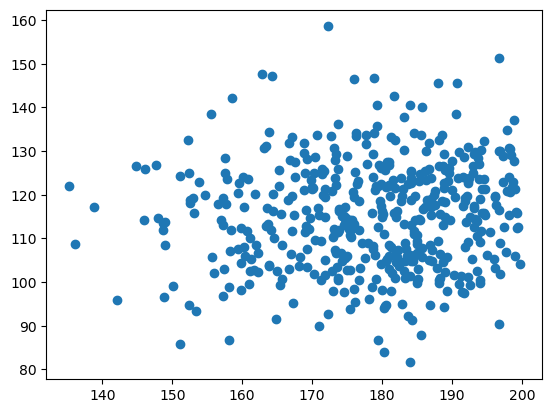

In [245]:
plt.plot(x_train[:,3],y_train[:,0],'o')

In [246]:
np.linspace(50,300,11).shape

(11,)

In [247]:
X=x_train
y=y_train
x_train2, x_test, y_train2, y_test = train_test_split(
    X,
    y,
    test_size=45,
    random_state=seed
)

In [261]:
x_train2.shape

torch.Size([423, 46])

In [262]:
nn=[100,200,300,350,400,420]
R2=torch.zeros((len(nn),2,1))
for k,n in enumerate(nn):
    
    b=np.random.choice(range(x_train2.shape[0]),n,replace=False)
    emulator_s = GPE.ensemble(x_train2[b],y_train2[b,[3]][:,None],mean_func="structured",training_iter=1000,poly_degree=1)
    emulator = GPE.ensemble(x_train2[b],y_train2[b,[3]][:,None],mean_func="linear",training_iter=1000)
    
    R2[k,:]=torch.cat((emulator_s.R2(x_test,y_test[:,[3]])[None],emulator.R2(x_test,y_test[:,[3]])[None]),axis=0)
    print(R2[k,:])

0
0
tensor([[0.4606],
        [0.5438]], grad_fn=<SliceBackward0>)
0
0
tensor([[0.4633],
        [0.6228]], grad_fn=<SliceBackward0>)
0
0
tensor([[0.5567],
        [0.6572]], grad_fn=<SliceBackward0>)
0
0
tensor([[0.4902],
        [0.6726]], grad_fn=<SliceBackward0>)
0
0
tensor([[0.5446],
        [0.6820]], grad_fn=<SliceBackward0>)
0
0
tensor([[0.5672],
        [0.6864]], grad_fn=<SliceBackward0>)


In [263]:
R2

tensor([[[0.4606],
         [0.5438]],

        [[0.4633],
         [0.6228]],

        [[0.5567],
         [0.6572]],

        [[0.4902],
         [0.6726]],

        [[0.5446],
         [0.6820]],

        [[0.5672],
         [0.6864]]], grad_fn=<CopySlices>)

In [264]:
x_train2.shape

torch.Size([423, 46])

In [265]:
np.linspace(50,420,11)

array([ 50.,  87., 124., 161., 198., 235., 272., 309., 346., 383., 420.])

In [267]:
reps= 5
p = np.linspace(50,420,11)
R2 = torch.zeros(28,p.shape[0])
MSE = torch.zeros(28,p.shape[0])
ISE = torch.zeros(28,p.shape[0])
for i in range(reps):  
    X=x_train
    y=y_train[:,[3]]
    x_train2, x_test, y_train2, y_test = train_test_split(
        X,
        y,
        test_size=45,
        random_state=seed+i
    )
    for j,pn in enumerate(p):

        X=x_train2
        y=y_train2
        x_train3, x_test1, y_train3, y_test1 = train_test_split(
            X,
            y,
            train_size=int(pn),
            random_state=seed+i
        )
        emulator = GPE.ensemble(x_train3,y_train3,mean_func="linear",training_iter=500);
        R2[:,j]+=emulator.R2(x_test,y_test)/reps
        MSE[:,j]+=emulator.MSE(x_test,y_test)/reps
        ISE[:,j]+=emulator.ISE(x_test,y_test)/reps
        print(R2[:,j])

0
tensor([-2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975,
        -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975,
        -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975, -2.4975,
        -2.4975, -2.4975, -2.4975, -2.4975], grad_fn=<SelectBackward0>)
0
tensor([-0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053,
        -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053,
        -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053, -0.0053,
        -0.0053, -0.0053, -0.0053, -0.0053], grad_fn=<SelectBackward0>)
0
tensor([0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696,
        0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696,
        0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696, 0.0696,
        0.0696], grad_fn=<SelectBackward0>)
0
tensor([0.0929, 0.0929, 0.0929, 0.0929, 0.0929, 0.0929, 0.0929, 0.0929, 0.0929,
    

tensor([0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407,
        0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407,
        0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407, 0.4407,
        0.4407], grad_fn=<SelectBackward0>)
0
tensor([0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450,
        0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450,
        0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450, 0.4450,
        0.4450], grad_fn=<SelectBackward0>)
0
tensor([0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422,
        0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422,
        0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422, 0.4422,
        0.4422], grad_fn=<SelectBackward0>)
0
tensor([0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400,
        0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400, 0.4400

In [84]:
y_labels

,0
0,LVedv
1,LVedp
2,LVesv
3,LVpMax
4,LVdpdtMax
5,LVdpdtMin
6,RVedv
7,RVedp
8,RVesv
9,RVpMax


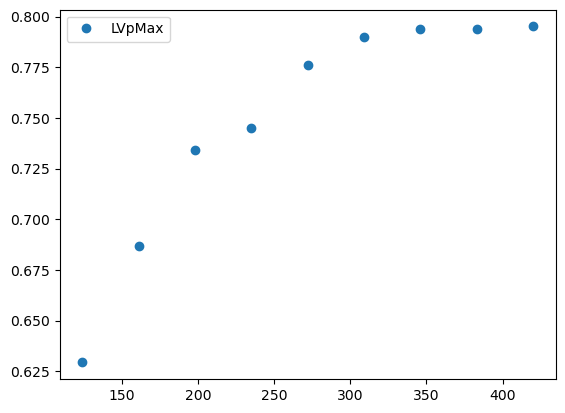

In [91]:
lev=3
plt.plot(p[2:,],R2.detach().numpy().T[2:,lev],'o')
plt.legend(y_labels.values[lev])

Text(0.5, 0, 'Training points')

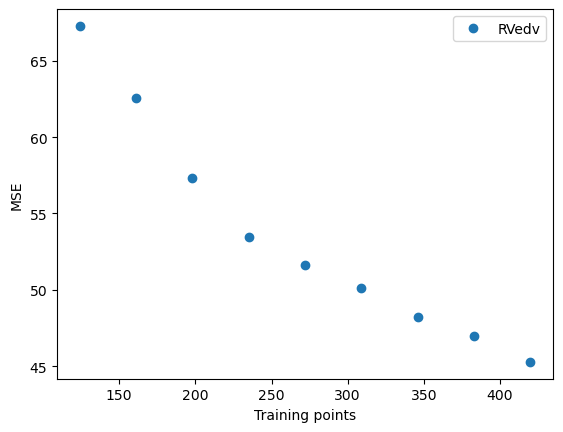

In [92]:
lev=6
plt.plot(p[2:,],MSE.detach().numpy().T[2:,lev],'o')
plt.legend(y_labels.values[lev])
plt.ylabel('MSE')
plt.xlabel('Training points')

In [93]:
y_train[:,lev]

tensor([147.4900, 122.1300, 147.2100, 149.7800, 143.0400, 164.3400, 128.1200,
        127.1600, 145.9800, 142.7500, 113.5400, 151.4700, 140.5500, 162.8500,
        146.2300, 144.7800, 188.4200, 127.3900, 126.7000, 132.4500, 132.8600,
        133.4500, 174.7200, 133.7500, 125.6900, 119.0400, 127.8100, 127.6900,
        103.1200, 128.0700, 116.0600, 154.6000, 140.9900, 163.7700, 140.9200,
        126.5100, 122.1300, 152.0100, 120.0900, 139.7500, 154.6600, 139.2300,
        129.7000, 133.0300, 135.9000, 152.7800, 160.0000, 125.7400, 136.6100,
        140.9500, 143.7600, 111.8600, 147.8600, 128.0700, 118.1200, 142.5500,
        155.8200, 140.9400, 123.0400, 121.6500, 135.7400, 134.7600, 116.1000,
        133.7100, 153.9100, 155.5800, 156.1200, 132.1400, 134.0100, 153.7800,
        144.3800, 143.5600, 127.8400, 108.5900, 126.1000, 161.5500, 143.1600,
        135.9700, 124.6200, 132.2300, 134.6700, 145.2500, 119.4300, 124.2100,
        134.2400, 148.9300, 113.4800, 148.9000, 145.6100, 168.62

Text(0.5, 0, 'Training points')

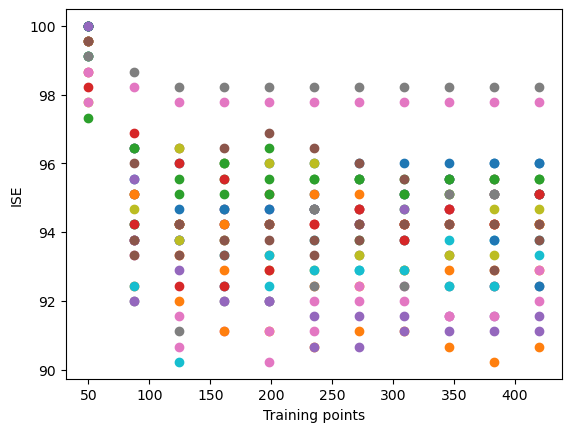

In [94]:
lev=6
plt.plot(p[:,],ISE.detach().numpy().T[:,],'o');
plt.ylabel('ISE')
plt.xlabel('Training points')

In [95]:
R2np=R2.detach().numpy()

In [96]:
R2diff=np.diff(R2np,axis=1)

Text(0.5, 0, 'training points')

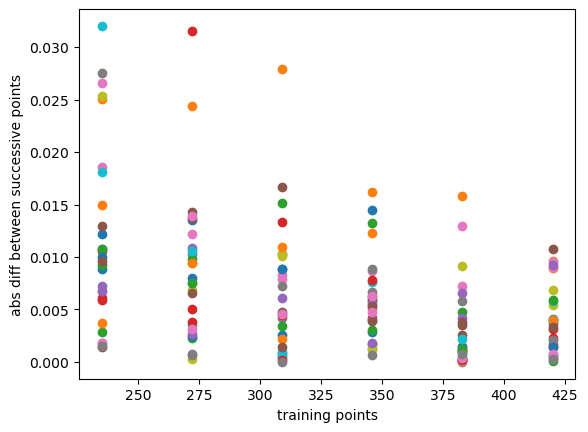

In [97]:
lev=6
plt.plot(p[5:,],np.abs(R2diff.T[4:,]),'o')
#plt.legend(y_labels.values[lev])
plt.ylabel('abs diff between successive points')
plt.xlabel('training points')

In [98]:
emulator = GPE.ensemble(x_train,y_train,mean_func="linear",training_iter=500)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27


In [99]:
nDim = input_masked.shape[1]
boundsMaxMin = []
for i in range(nDim):
    boundsMaxMin.append([np.min(input_masked.iloc[:,i]),np.max(input_masked.iloc[:,i])])
    print(boundsMaxMin[i])

[5.83464e-05, 0.000154081]
[0.0652009, 0.122952]
[0.000921633, 0.00242766]
[135.206, 199.704]
[0.175616, 0.52417]
[1.61378, 3.03954]
[1.86623, 2.9983]
[0.125877, 0.35794]
[0.258678, 0.747163]
[12.6117, 37.1001]
[0.0125385, 0.0314043]
[0.407887, 1.00927]
[1.52985, 4.46592]
[0.00298249, 0.00748154]
[0.0356104, 0.104365]
[0.0836606, 0.184816]
[50.5061, 149.361]
[0.180935, 0.513914]
[2.51645, 7.42397]
[1.04007, 2.97164]
[0.126018, 0.372123]
[0.25082, 0.747605]
[12.6298, 37.4525]
[1.12081, 3.31601]
[0.433656, 1.28794]
[4.51488, 13.481]
[0.675114, 0.836114]
[0.470936, 0.644341]
[100, 200]
[0.119323, 4.99241]
[0.180614, 4.98004]
[254.56, 1499.78]
[256.976, 1497.04]
[151.853, 998.778]
[151.778, 999.663]
[150.165, 994.975]
[57.4508, 159.391]
[4.06892, 78.9918]
[0.521288, 23.9784]
[4.05338, 11.9518]
[0.75574, 4.99708]
[1.53412, 5.99971]
[0.000507773, 0.0495423]
[0.50057, 0.998839]
[8.03514, 27.9295]
[4.11977, 7.69434]


In [100]:
##### from SALib.sample import saltelli
from SALib.sample import saltelli
from SALib.analyze import sobol
from SALib.test_functions import Ishigami
import numpy as np

# Define the model inputs
problem = {
    'num_vars': nDim,
    'names': x_labels,
    'bounds': boundsMaxMin
    #'bounds': [[-1, 1],
     #          [-1, 1],
      #         [-1, 1],
       #        [-1, 1],
        #       [-1, 1],
         #      [-1, 1],
          #     [-1, 1],
           #    [-1, 1],
            #   [-1,1]]
}

# Generate samples
param_values = saltelli.sample(problem, 1024)

data1 = torch.tensor(param_values)
#data1.columns = X_train.columns

Ymean=emulator.predict(data1)

/var/folders/_j/ptyc01811q5b1dg30hshtfzh0000gr/T/ipykernel_24036/2553582652.py:24: DeprecationWarning: `salib.sample.saltelli` will be removed in SALib 1.5. Please use `salib.sample.sobol`
  param_values = saltelli.sample(problem, 1024)


In [101]:
data1.shape

torch.Size([96256, 46])

In [102]:
Si = []
nMod = y_all.shape[1]
nDim = input_masked.shape[1]
for i in range(nMod):
    Si.append(sobol.analyze(problem, Ymean[:,i].detach().numpy(), print_to_console=True,calc_second_order=True))

                               ST       ST_conf
(PCa_b,)             6.036255e-03  5.242187e-04
(trpnmax,)           2.700433e-04  2.373274e-05
(Gncx_b,)            1.658529e-04  1.558121e-05
(Tref,)              5.728438e-05  4.781550e-06
(perm50,)            1.265296e-03  1.297377e-04
(nperm,)             6.546206e-05  5.817418e-06
(TRPN_n,)            5.742301e-03  5.115833e-04
(dr,)                1.450197e-03  1.529357e-04
(wfrac,)             6.862906e-07  6.605043e-08
(TOT_A,)             9.027409e-04  7.423208e-05
(ktm_unblock,)       5.320353e-05  4.324012e-06
(ca50,)              2.966690e-03  3.212859e-04
(mu,)                3.209049e-04  2.742094e-05
(maxI_up,)           1.911541e-03  1.859208e-04
(maxTrpn,)           6.794153e-03  6.143354e-04
(g_CaL,)             7.842319e-03  7.938031e-04
(Tref,)              9.032415e-04  7.839609e-05
(perm50,)            9.322190e-03  8.665747e-04
(nperm,)             6.077539e-05  5.841695e-06
(TRPN_n,)            7.468068e-03  5.975

                               ST       ST_conf
(PCa_b,)             3.546165e-02  3.540765e-03
(trpnmax,)           7.167803e-03  5.910424e-04
(Gncx_b,)            2.070591e-02  1.808189e-03
(Tref,)              2.158309e-02  1.814295e-03
(perm50,)            3.889989e-02  4.052402e-03
(nperm,)             2.136283e-03  1.936027e-04
(TRPN_n,)            9.076487e-05  9.556883e-06
(dr,)                7.885252e-03  7.554193e-04
(wfrac,)             1.959561e-04  1.978763e-05
(TOT_A,)             1.767516e-03  1.597246e-04
(ktm_unblock,)       6.056646e-04  5.747848e-05
(ca50,)              5.965236e-02  5.439727e-03
(mu,)                6.508365e-04  5.119725e-05
(maxI_up,)           6.467176e-05  6.083201e-06
(maxTrpn,)           4.934319e-05  4.603018e-06
(g_CaL,)             6.053926e-06  5.266679e-07
(Tref,)              4.301426e-05  4.124775e-06
(perm50,)            6.374009e-04  5.843526e-05
(nperm,)             2.421339e-04  2.455261e-05
(TRPN_n,)            2.538667e-03  2.487

                           ST       ST_conf
(PCa_b,)             0.005869  5.427243e-04
(trpnmax,)           0.011744  1.028151e-03
(Gncx_b,)            0.019602  1.814793e-03
(Tref,)              0.021274  1.964328e-03
(perm50,)            0.000023  1.958914e-06
(nperm,)             0.000298  2.635299e-05
(TRPN_n,)            0.002354  2.341098e-04
(dr,)                0.176436  1.570971e-02
(wfrac,)             0.058035  5.667435e-03
(TOT_A,)             0.025594  2.281902e-03
(ktm_unblock,)       0.061283  5.400996e-03
(ca50,)              0.015598  1.596882e-03
(mu,)                0.086523  7.446748e-03
(maxI_up,)           0.000700  6.019003e-05
(maxTrpn,)           0.000202  1.938069e-05
(g_CaL,)             0.000018  1.721758e-06
(Tref,)              0.000836  6.909915e-05
(perm50,)            0.000171  1.690702e-05
(nperm,)             0.000406  3.953525e-05
(TRPN_n,)            0.000882  7.933851e-05
(dr,)                0.000224  2.087500e-05
(wfrac,)             0.000280  2

                           ST       ST_conf
(PCa_b,)             0.000244  2.634803e-05
(trpnmax,)           0.000868  8.541902e-05
(Gncx_b,)            0.005893  5.388067e-04
(Tref,)              0.003292  3.189273e-04
(perm50,)            0.001811  1.706757e-04
(nperm,)             0.000017  1.333134e-06
(TRPN_n,)            0.001391  1.199957e-04
(dr,)                0.000035  2.845101e-06
(wfrac,)             0.004944  4.558756e-04
(TOT_A,)             0.000642  5.529212e-05
(ktm_unblock,)       0.000718  6.272365e-05
(ca50,)              0.000042  3.724644e-06
(mu,)                0.001048  8.746219e-05
(maxI_up,)           0.000862  7.978575e-05
(maxTrpn,)           0.008560  7.981326e-04
(g_CaL,)             0.004596  4.131819e-04
(Tref,)              0.000050  4.530778e-06
(perm50,)            0.004451  3.908212e-04
(nperm,)             0.000619  5.612630e-05
(TRPN_n,)            0.001196  1.092097e-04
(dr,)                0.000418  4.043783e-05
(wfrac,)             0.000122  1

                               ST       ST_conf
(PCa_b,)             7.014846e-03  6.458201e-04
(trpnmax,)           2.129671e-03  1.499220e-04
(Gncx_b,)            1.743486e-02  1.644965e-03
(Tref,)              7.372601e-03  7.782761e-04
(perm50,)            1.573419e-02  1.418811e-03
(nperm,)             1.197690e-04  9.104975e-06
(TRPN_n,)            5.414308e-04  4.862832e-05
(dr,)                4.580650e-02  3.728137e-03
(wfrac,)             1.047198e-03  8.968953e-05
(TOT_A,)             3.100674e-02  2.647595e-03
(ktm_unblock,)       9.259681e-03  8.487356e-04
(ca50,)              1.845791e-02  1.635299e-03
(mu,)                2.100007e-02  1.985870e-03
(maxI_up,)           9.242147e-05  7.624724e-06
(maxTrpn,)           7.600226e-04  7.092197e-05
(g_CaL,)             2.454192e-04  2.382185e-05
(Tref,)              4.382495e-05  3.890705e-06
(perm50,)            3.694372e-04  3.396819e-05
(nperm,)             2.128717e-04  1.845341e-05
(TRPN_n,)            4.564639e-06  4.065

                               ST       ST_conf
(PCa_b,)             3.489184e-05  3.444488e-06
(trpnmax,)           6.226733e-02  5.756486e-03
(Gncx_b,)            6.454418e-03  5.917385e-04
(Tref,)              5.781869e-02  5.293510e-03
(perm50,)            5.922001e-04  5.489094e-05
(nperm,)             3.158287e-02  3.115271e-03
(TRPN_n,)            8.363701e-02  8.810140e-03
(dr,)                4.415837e-02  4.481586e-03
(wfrac,)             5.748506e-03  5.565918e-04
(TOT_A,)             1.034520e-05  9.610259e-07
(ktm_unblock,)       2.313697e-02  2.163242e-03
(ca50,)              6.891622e-03  6.216625e-04
(mu,)                2.590559e-02  2.536886e-03
(maxI_up,)           7.398423e-04  6.993936e-05
(maxTrpn,)           7.796979e-04  6.714698e-05
(g_CaL,)             3.423363e-03  3.781736e-04
(Tref,)              1.100713e-03  1.077715e-04
(perm50,)            3.185046e-03  2.776515e-04
(nperm,)             1.351631e-04  1.332963e-05
(TRPN_n,)            2.032987e-03  1.751

                               ST       ST_conf
(PCa_b,)             1.385111e-03  1.267114e-04
(trpnmax,)           1.902993e-05  1.770596e-06
(Gncx_b,)            1.556433e-03  1.556127e-04
(Tref,)              7.030400e-05  6.531293e-06
(perm50,)            9.139850e-04  7.835488e-05
(nperm,)             6.364023e-05  5.714275e-06
(TRPN_n,)            2.133428e-05  2.212210e-06
(dr,)                3.690614e-04  3.668680e-05
(wfrac,)             5.036893e-04  4.711232e-05
(TOT_A,)             9.200169e-05  8.802435e-06
(ktm_unblock,)       2.466380e-05  2.426669e-06
(ca50,)              1.774527e-03  1.923600e-04
(mu,)                3.229023e-04  3.364240e-05
(maxI_up,)           7.754640e-03  7.770231e-04
(maxTrpn,)           9.261303e-02  9.592042e-03
(g_CaL,)             1.516268e-01  1.357797e-02
(Tref,)              2.937228e-02  2.839192e-03
(perm50,)            1.451027e-01  1.618975e-02
(nperm,)             6.272404e-03  5.512932e-04
(TRPN_n,)            3.760564e-02  3.631

                           ST       ST_conf
(PCa_b,)             0.004730  4.649222e-04
(trpnmax,)           0.001004  8.965511e-05
(Gncx_b,)            0.014020  1.283478e-03
(Tref,)              0.000155  1.498002e-05
(perm50,)            0.020279  1.803566e-03
(nperm,)             0.001096  1.074906e-04
(TRPN_n,)            0.000338  3.318339e-05
(dr,)                0.000575  5.280968e-05
(wfrac,)             0.000432  3.763338e-05
(TOT_A,)             0.000099  9.085505e-06
(ktm_unblock,)       0.000049  4.485123e-06
(ca50,)              0.017325  1.723409e-03
(mu,)                0.000310  2.681318e-05
(maxI_up,)           0.000520  4.531245e-05
(maxTrpn,)           0.000069  6.191480e-06
(g_CaL,)             0.000056  4.943399e-06
(Tref,)              0.000005  4.484862e-07
(perm50,)            0.000018  1.811107e-06
(nperm,)             0.000158  1.658775e-05
(TRPN_n,)            0.000561  5.435388e-05
(dr,)                0.004124  3.749787e-04
(wfrac,)             0.000657  6

                               ST       ST_conf
(PCa_b,)             3.150894e-02  2.588218e-03
(trpnmax,)           3.532035e-03  3.197377e-04
(Gncx_b,)            4.258403e-02  3.793127e-03
(Tref,)              1.336903e-03  1.020452e-04
(perm50,)            5.532193e-02  4.339509e-03
(nperm,)             9.829760e-05  9.020434e-06
(TRPN_n,)            2.738527e-05  2.549865e-06
(dr,)                1.394683e-04  1.147737e-05
(wfrac,)             2.577637e-03  2.155587e-04
(TOT_A,)             5.798757e-04  5.103091e-05
(ktm_unblock,)       1.562531e-05  1.483773e-06
(ca50,)              6.651392e-02  6.335078e-03
(mu,)                5.915649e-04  5.215119e-05
(maxI_up,)           6.204904e-05  5.739805e-06
(maxTrpn,)           2.541119e-04  2.080705e-05
(g_CaL,)             2.432539e-03  2.071710e-04
(Tref,)              3.276699e-03  3.057865e-04
(perm50,)            4.873016e-03  4.355236e-04
(nperm,)             9.382943e-04  8.274744e-05
(TRPN_n,)            7.468992e-03  6.544

                               ST       ST_conf
(PCa_b,)             4.944207e-04  4.683691e-05
(trpnmax,)           2.114439e-05  2.060651e-06
(Gncx_b,)            1.622127e-04  1.339745e-05
(Tref,)              4.640745e-05  4.347959e-06
(perm50,)            6.435552e-07  5.984565e-08
(nperm,)             2.504810e-04  2.263374e-05
(TRPN_n,)            3.183592e-04  3.060475e-05
(dr,)                5.857751e-04  5.446257e-05
(wfrac,)             2.000290e-04  1.866761e-05
(TOT_A,)             7.138587e-04  6.905785e-05
(ktm_unblock,)       7.319890e-05  6.406958e-06
(ca50,)              5.593517e-04  5.412244e-05
(mu,)                1.352867e-05  1.258179e-06
(maxI_up,)           9.196506e-03  8.875752e-04
(maxTrpn,)           1.078845e-01  1.039820e-02
(g_CaL,)             1.822922e-01  1.839064e-02
(Tref,)              3.610511e-02  3.138782e-03
(perm50,)            1.704737e-01  1.513834e-02
(nperm,)             8.283557e-03  8.371877e-04
(TRPN_n,)            5.073633e-02  5.100

                               ST       ST_conf
(PCa_b,)             3.595933e-02  3.202821e-03
(trpnmax,)           2.459826e-02  2.048276e-03
(Gncx_b,)            2.937939e-02  2.356601e-03
(Tref,)              1.713697e-02  1.619774e-03
(perm50,)            3.652568e-02  3.371719e-03
(nperm,)             1.254260e-02  1.109936e-03
(TRPN_n,)            2.618840e-04  2.555763e-05
(dr,)                1.267914e-02  1.157889e-03
(wfrac,)             1.012086e-03  8.407467e-05
(TOT_A,)             2.516574e-03  1.912420e-04
(ktm_unblock,)       9.001691e-05  8.801981e-06
(ca50,)              4.657173e-02  4.868809e-03
(mu,)                1.227210e-03  1.174990e-04
(maxI_up,)           3.008528e-03  2.790865e-04
(maxTrpn,)           2.195669e-04  1.985524e-05
(g_CaL,)             6.006191e-03  5.594635e-04
(Tref,)              4.713981e-03  4.153317e-04
(perm50,)            8.145037e-03  7.468887e-04
(nperm,)             1.393524e-03  1.180140e-04
(TRPN_n,)            5.508016e-03  4.758

                           ST       ST_conf
(PCa_b,)             0.058291  5.243840e-03
(trpnmax,)           0.008209  7.450441e-04
(Gncx_b,)            0.041515  4.241922e-03
(Tref,)              0.011251  1.014154e-03
(perm50,)            0.077233  7.002024e-03
(nperm,)             0.003036  2.859564e-04
(TRPN_n,)            0.002885  2.525048e-04
(dr,)                0.001332  1.190326e-04
(wfrac,)             0.000237  2.320191e-05
(TOT_A,)             0.000289  2.674187e-05
(ktm_unblock,)       0.000039  3.930937e-06
(ca50,)              0.104378  1.018368e-02
(mu,)                0.000006  5.088487e-07
(maxI_up,)           0.000489  4.293487e-05
(maxTrpn,)           0.000002  1.820034e-07
(g_CaL,)             0.008276  7.025757e-04
(Tref,)              0.005490  4.994270e-04
(perm50,)            0.012964  1.360329e-03
(nperm,)             0.002794  2.760996e-04
(TRPN_n,)            0.010371  1.016183e-03
(dr,)                0.001259  1.162573e-04
(wfrac,)             0.000135  1

                               ST       ST_conf
(PCa_b,)             1.036143e-05  7.956657e-07
(trpnmax,)           2.526577e-04  2.060165e-05
(Gncx_b,)            5.310566e-05  4.343492e-06
(Tref,)              4.339074e-04  3.294131e-05
(perm50,)            1.649843e-03  1.405417e-04
(nperm,)             9.992691e-04  8.097558e-05
(TRPN_n,)            8.966401e-04  7.800488e-05
(dr,)                8.663706e-04  6.721885e-05
(wfrac,)             1.762703e-04  1.515019e-05
(TOT_A,)             2.391631e-04  2.083259e-05
(ktm_unblock,)       1.760447e-04  1.472555e-05
(ca50,)              1.672402e-07  1.593950e-08
(mu,)                2.188358e-05  1.864271e-06
(maxI_up,)           8.113699e-06  7.229096e-07
(maxTrpn,)           9.745953e-05  7.890174e-06
(g_CaL,)             1.779852e-05  1.432701e-06
(Tref,)              3.035252e-04  2.440704e-05
(perm50,)            4.002061e-04  2.923428e-05
(nperm,)             2.093749e-05  1.770640e-06
(TRPN_n,)            7.406308e-05  6.601

In [103]:
Si_first=np.zeros((nDim,nMod))
Si_total=np.zeros((nDim,nMod))
for i in range(nMod):
    total_Si, first_Si, second_Si = Si[i].to_df()
    Si_first[:,i] =  first_Si.iloc[:,0]
    Si_total[:,i] =  total_Si.iloc[:,0]


In [104]:
x_labels.values.squeeze().tolist()

['PCa_b',
 'trpnmax',
 'Gncx_b',
 'Tref',
 'perm50',
 'nperm',
 'TRPN_n',
 'dr',
 'wfrac',
 'TOT_A',
 'ktm_unblock',
 'ca50',
 'mu',
 'maxI_up',
 'maxTrpn',
 'g_CaL',
 'Tref',
 'perm50',
 'nperm',
 'TRPN_n',
 'dr',
 'wfrac',
 'TOT_A',
 'phi',
 'ca50',
 'mu',
 'CV_ventricles',
 'CV_atria',
 'AV_delay',
 'Rsys',
 'Rpulm',
 'mitral_area',
 'tricuspid_area',
 'aortic_area',
 'sysOrifice_area',
 'pulmOrifice_area',
 'AoPref',
 'PaPref',
 'VePref',
 'kArt',
 'a_ventricles',
 'a_atria',
 'k_peri',
 'Tref_lvrv',
 'EDP_lv',
 'EDP_rv']

In [105]:
y_all.columns.tolist()

['LVedv',
 'LVedp',
 'LVesv',
 'LVpMax',
 'LVdpdtMax',
 'LVdpdtMin',
 'RVedv',
 'RVedp',
 'RVesv',
 'RVpMax',
 'RVdpdtMax',
 'RVdpdtMin',
 'LAedv',
 'LAesv',
 'LAvMax',
 'LApMax',
 'RAedv',
 'RAesv',
 'RAvMax',
 'RApMax',
 'LAsvA',
 'LAinflV',
 'LAsvV',
 'RAsvA',
 'RAinflV',
 'RAsvV',
 'A_TAT',
 'V_TAT']

In [106]:
['PCa_b',
 'Tref',
 'perm50',
 'CV_ventricles',
 'a_ventricles',
 'EDP_lv',
 'EDP_rv',
 'Rsys',
 'Rpulm']

['PCa_b',
 'Tref',
 'perm50',
 'CV_ventricles',
 'a_ventricles',
 'EDP_lv',
 'EDP_rv',
 'Rsys',
 'Rpulm']

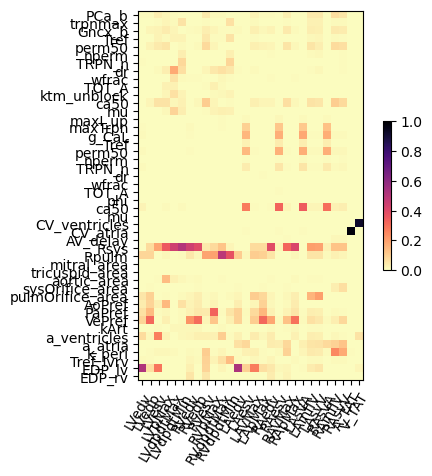

In [107]:
inputs = X_all.columns.tolist()
outputs = y_all.columns.tolist()
fig, ax = plt.subplots()
im = ax.imshow(Si_first,cmap='magma_r',vmin=0,vmax=1)

ax.set_xticks(np.arange(len(outputs)),labels=outputs)
ax.set_yticks(np.arange(len(inputs)), labels=inputs)
plt.setp(ax.get_xticklabels(), rotation=60, ha="right",
         rotation_mode="anchor");

plt.colorbar(im,fraction=0.015, pad=0.04)

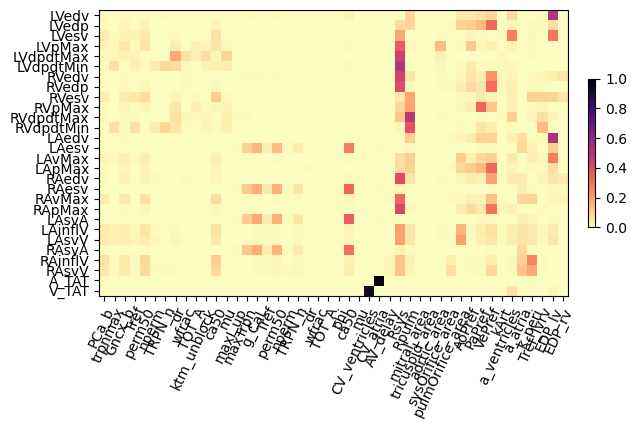

In [108]:
inputs = X_all.columns.tolist()
outputs = y_all.columns.tolist()
fig, ax = plt.subplots()
im = ax.imshow(Si_total.T[:,],cmap='magma_r',vmin=0,vmax=1)

ax.set_yticks(np.arange(len(outputs)),labels=outputs)
ax.set_xticks(np.arange(len(inputs)), labels=inputs)
plt.setp(ax.get_xticklabels(), rotation=65, ha="right",
         rotation_mode="anchor");

plt.colorbar(im,fraction=0.015, pad=0.04)

In [109]:
ref=np.argsort(Si_total[:,3])[::-1].tolist()
tot = np.sum(Si_total[:,3])
sens = Si_total[ref,3]

In [110]:
sens

array([3.47879426e-01, 1.37465692e-01, 1.10124238e-01, 5.28906495e-02,
       5.17671772e-02, 3.90697631e-02, 3.36596377e-02, 2.90650362e-02,
       2.60987004e-02, 2.16732279e-02, 1.91035668e-02, 1.71608642e-02,
       1.44995234e-02, 1.39748307e-02, 1.26451476e-02, 1.26417512e-02,
       1.07087881e-02, 9.85879321e-03, 9.69340237e-03, 4.09587551e-03,
       2.36614763e-03, 2.34109756e-03, 2.03713703e-03, 1.96984011e-03,
       1.63452783e-03, 1.43934466e-03, 1.21217802e-03, 1.08689347e-03,
       1.01668078e-03, 9.34212403e-04, 5.87456302e-04, 5.23552009e-04,
       5.19270403e-04, 4.67545239e-04, 1.92805273e-04, 1.74951506e-04,
       9.41118717e-05, 5.30538309e-05, 4.63137368e-05, 4.07052242e-05,
       3.46554599e-05, 3.30517225e-05, 2.24962927e-05, 1.22442857e-05,
       7.12828939e-07, 3.91941088e-07])

In [111]:
np.sum(sens[0:15])

0.9270774806492127

In [112]:
centre = (np.array(boundsMaxMin)[:,1]+np.array(boundsMaxMin)[:,0])/2

In [113]:
boundsMaxMin

[[5.83464e-05, 0.000154081],
 [0.0652009, 0.122952],
 [0.000921633, 0.00242766],
 [135.206, 199.704],
 [0.175616, 0.52417],
 [1.61378, 3.03954],
 [1.86623, 2.9983],
 [0.125877, 0.35794],
 [0.258678, 0.747163],
 [12.6117, 37.1001],
 [0.0125385, 0.0314043],
 [0.407887, 1.00927],
 [1.52985, 4.46592],
 [0.00298249, 0.00748154],
 [0.0356104, 0.104365],
 [0.0836606, 0.184816],
 [50.5061, 149.361],
 [0.180935, 0.513914],
 [2.51645, 7.42397],
 [1.04007, 2.97164],
 [0.126018, 0.372123],
 [0.25082, 0.747605],
 [12.6298, 37.4525],
 [1.12081, 3.31601],
 [0.433656, 1.28794],
 [4.51488, 13.481],
 [0.675114, 0.836114],
 [0.470936, 0.644341],
 [100, 200],
 [0.119323, 4.99241],
 [0.180614, 4.98004],
 [254.56, 1499.78],
 [256.976, 1497.04],
 [151.853, 998.778],
 [151.778, 999.663],
 [150.165, 994.975],
 [57.4508, 159.391],
 [4.06892, 78.9918],
 [0.521288, 23.9784],
 [4.05338, 11.9518],
 [0.75574, 4.99708],
 [1.53412, 5.99971],
 [0.000507773, 0.0495423],
 [0.50057, 0.998839],
 [8.03514, 27.9295],
 [4.119

In [114]:
centre[[1,2,4,5,]]

array([9.4076450e-02, 1.6746465e-03, 3.4989300e-01, 2.3266600e+00])

In [115]:
boundsMaxMin=np.array(boundsMaxMin)

In [116]:
boundsMaxMinOrig=np.array(boundsMaxMin)

In [117]:
def log_prior(theta):
    
    #if (np.array(boundsMaxMin)[:,0]<theta).all() and (theta<np.array(boundsMaxMin)[:,1]).all():
        
    if (np.array(boundsMaxMin)[:,0]<theta).all() and (theta<np.array(boundsMaxMin)[:,1]).all():
        return 0.0
    return -np.inf

In [118]:
def log_likelihood(x,emulator,y_val,obs_error):
    x=torch.tensor(x)[None]
    with gpytorch.settings.fast_pred_var(): #This line makes it fast!
        ll =np.sum((emulator.ensemble_log_likelihood_obs_error(x,y_val[None,:],obs_error)).detach().numpy())
    return ll

In [119]:
def log_prob(theta, emulator,y_val,obs_error):
    
    lp = log_prior(theta)
    if not np.isfinite(lp):
        return -np.inf

    return lp + log_likelihood(theta,emulator, y_val,obs_error)

In [120]:
import emcee

In [121]:
ref[0:2]

[29, 33]

In [122]:
len(ref)

46

In [133]:
sobolSum = np.zeros(len(ref))
pred = np.zeros(len(ref))
for i in range(len(ref)):
    j=i+1
    sobolSum[i]=np.sum(sens[0:j])
    
    x_train_red=x_train2[:,ref[0:j]]
    x_test_red=x_test[:,ref[0:j]]
    
    emulator = GPE.ensemble(x_train_red,y_train2[:,[3]],mean_func="linear",training_iter=1000)
    pred[i]=emulator.R2(x_test_red,y_test[:,[3]])

0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0


In [134]:
num=np.linspace(1,len(ref),len(ref))

In [135]:
sobolSum

array([0.34787943, 0.48534512, 0.59546936, 0.64836001, 0.70012718,
       0.73919695, 0.77285658, 0.80192162, 0.82802032, 0.84969355,
       0.86879711, 0.88595798, 0.9004575 , 0.91443233, 0.92707748,
       0.93971923, 0.95042802, 0.96028681, 0.96998022, 0.97407609,
       0.97644224, 0.97878334, 0.98082047, 0.98279031, 0.98442484,
       0.98586419, 0.98707636, 0.98816326, 0.98917994, 0.99011415,
       0.99070161, 0.99122516, 0.99174443, 0.99221197, 0.99240478,
       0.99257973, 0.99267384, 0.9927269 , 0.99277321, 0.99281392,
       0.99284857, 0.99288162, 0.99290412, 0.99291636, 0.99291708,
       0.99291747])

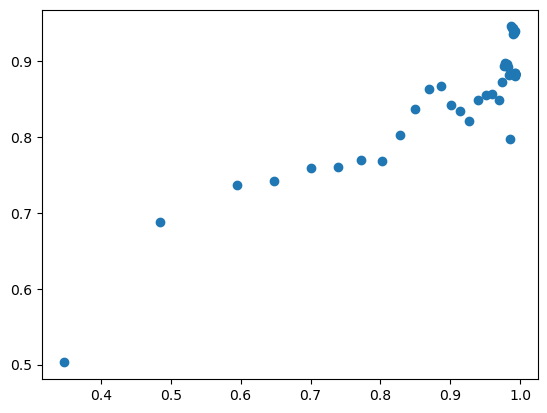

In [136]:
plt.plot(sobolSum,pred,'o')

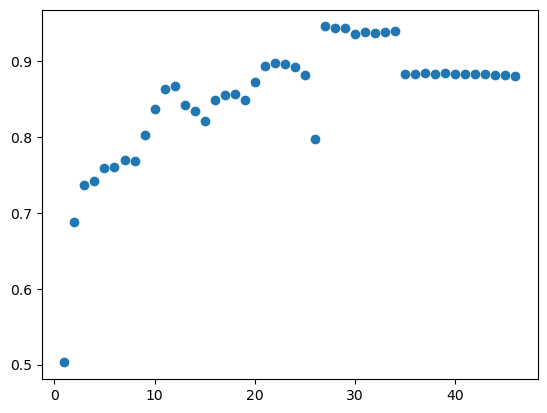

In [137]:
plt.plot(num,pred,'o')

In [194]:
index_lim = 20
x_train_red=x_train[:,ref[0:index_lim]]
x_test_red=x_test[:,ref[0:index_lim]]

In [195]:
emulator = GPE.ensemble(x_train_red,y_train[:,[3]],mean_func="linear",training_iter=1000)

0


In [196]:
emulator.R2(x_test_red,y_test[:,[3]])

tensor([0.9982], dtype=torch.float64, grad_fn=<RsubBackward1>)

In [197]:
boundsMaxMin=np.array(boundsMaxMinOrig)[ref[0:index_lim]]

In [198]:
y_test.shape

torch.Size([45, 28])

In [229]:
centre = (np.array(boundsMaxMin)[:,1]+np.array(boundsMaxMin)[:,0])/2
ndim = x_train_red.shape[1]
nwalkers = 2*index_lim
p0 = np.random.uniform(0,1,(nwalkers,ndim))*(np.array(boundsMaxMin)[:,1]-np.array(boundsMaxMin)[:,0])+np.array(boundsMaxMin)[:,0]
#y_val = torch.tensor([80,134])
y_val=y_train[4,[3]]
obs_error=((y_val*0.00005))**2

In [230]:
obs_error

tensor([3.3954e-05], dtype=torch.float64)

In [234]:
y_train[:,3].max()

tensor(260.8700, dtype=torch.float64)

In [231]:
y_val

tensor([116.5400], dtype=torch.float64)

In [202]:
y_val*0.18

tensor([18.8478], dtype=torch.float64)

In [203]:
obs_error

tensor([2.7410e-05], dtype=torch.float64)

In [216]:
sampler = emcee.EnsembleSampler(nwalkers, ndim, log_prob, args=[emulator,y_val,obs_error])

sampler.run_mcmc(p0, 60000,progress=True)

100%|███████████████████████████████████████████| 60000/60000 [11:18<00:00, 88.39it/s]


State([[4.05711258e+00 2.15443830e+02 7.24737614e+01 4.35075164e-01
  7.31741472e-01 2.06443055e-03 3.18685302e-01 2.11994229e+01
  3.51858703e+01 1.74395035e+00 1.56074317e-02 8.22922702e-05
  1.93471490e+00 8.69986237e-02 4.28213649e+00 1.88016066e+01
  2.61850937e-02 1.22417514e+00 1.69546259e+02 3.52160995e+02]
 [8.98295844e-01 1.66275318e+02 8.82802125e+01 4.64163827e-01
  5.38476658e-01 1.96753438e-03 3.15844478e-01 7.31496498e+00
  2.67520264e+01 4.00734789e+00 2.38303453e-02 1.14212808e-04
  2.51508376e+00 9.02310546e-02 4.69339410e+00 5.11181329e+01
  1.58684914e-02 7.99842562e-01 1.96383173e+02 6.08860414e+02]
 [3.73107630e+00 8.74268208e+02 8.11022306e+01 4.18169444e-01
  7.85747125e-01 1.53817762e-03 1.52707802e-01 2.21437740e+01
  3.01671782e+01 4.13645787e+00 1.96529329e-02 1.44748013e-04
  1.83672608e+00 8.49200266e-02 2.24753477e+00 3.89098672e+01
  5.26161877e-03 1.21004203e+00 1.45220425e+02 2.82556478e+02]
 [1.84525326e+00 9.47220138e+02 1.12601398e+02 2.23104069e-01

In [217]:
flat_samples = sampler.get_chain(discard=2000, thin=100, flat=True)
print(flat_samples.shape)

(23200, 20)


In [218]:
boundsMaxMin

array([[1.19323e-01, 4.99241e+00],
       [1.51853e+02, 9.98778e+02],
       [5.74508e+01, 1.59391e+02],
       [1.75616e-01, 5.24170e-01],
       [4.07887e-01, 1.00927e+00],
       [9.21633e-04, 2.42766e-03],
       [1.25877e-01, 3.57940e-01],
       [5.21288e-01, 2.39784e+01],
       [1.26117e+01, 3.71001e+01],
       [7.55740e-01, 4.99708e+00],
       [1.25385e-02, 3.14043e-02],
       [5.83464e-05, 1.54081e-04],
       [1.52985e+00, 4.46592e+00],
       [6.52009e-02, 1.22952e-01],
       [1.80614e-01, 4.98004e+00],
       [4.06892e+00, 7.89918e+01],
       [5.07773e-04, 4.95423e-02],
       [4.33656e-01, 1.28794e+00],
       [1.35206e+02, 1.99704e+02],
       [1.50165e+02, 9.94975e+02]])

In [219]:
flat_samples.shape

(23200, 20)

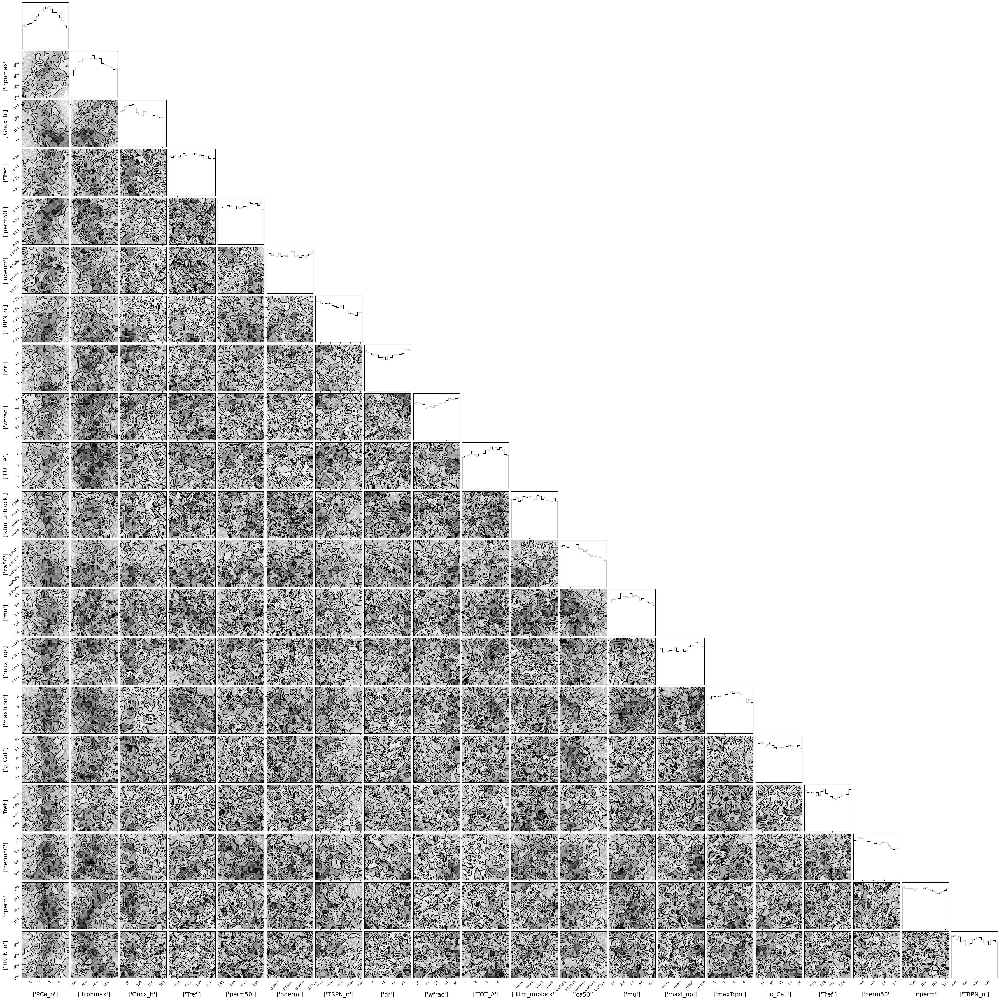

In [220]:
import corner

fig = corner.corner(
    flat_samples[:,:], labels=x_labels.values, label_kwargs=dict(fontsize=18)
);

(array([  17.,  255., 1375., 4083., 6638., 6206., 3428., 1050.,  134.,
          14.]),
 array([ 52.5069046 ,  63.59071732,  74.67453003,  85.75834656,
         96.84215546, 107.92596436, 119.00978088, 130.09359741,
        141.17739868, 152.26121521, 163.34503174]),
 <BarContainer object of 10 artists>)

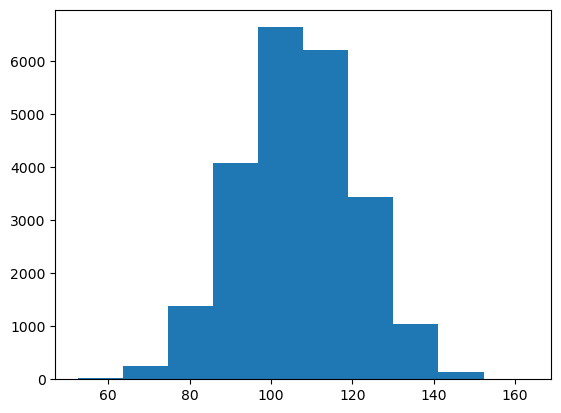

In [221]:
plt.hist(emulator.predict(torch.tensor(flat_samples)).detach().numpy()[:,0])

In [222]:
emulator.predict(torch.tensor(flat_samples)).mean(axis=0)

tensor([106.7346], grad_fn=<MeanBackward1>)

In [223]:
emulator.predict(torch.tensor(flat_samples)).std(axis=0)

tensor([14.2128], grad_fn=<StdBackward0>)

In [224]:
y_val*0.05

tensor([5.2355], dtype=torch.float64)

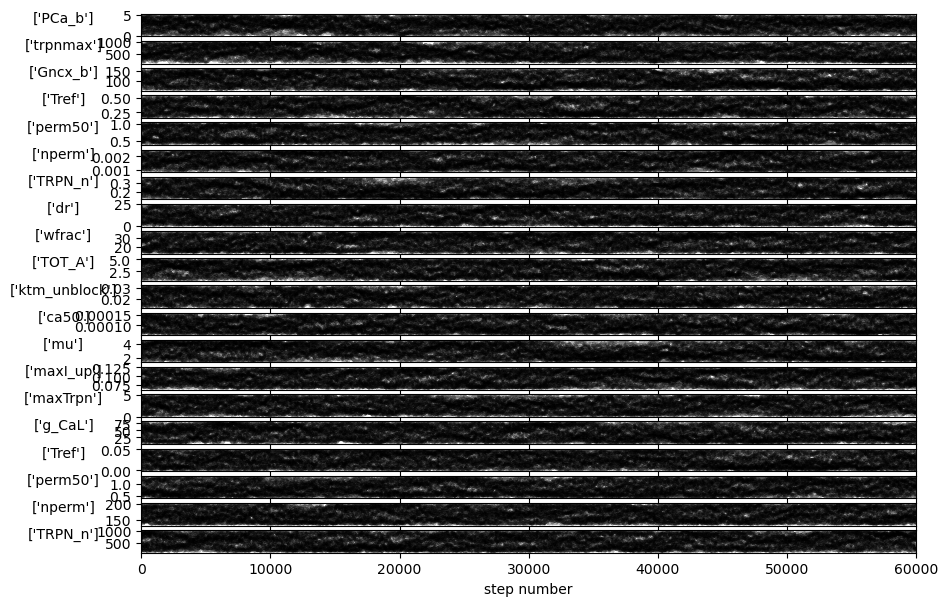

In [225]:
fig, axes = plt.subplots(index_lim, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = x_labels.values
for i in range(index_lim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i],rotation=0)
    ax.yaxis.set_label_coords(-0.1, 0.5)


axes[-1].set_xlabel("step number");

In [193]:
y_train[:,3].mean()

tensor(126.2685, dtype=torch.float64)

In [387]:
flat_samples.mean(axis=0)-flat_samples.std(axis=0)

array([2.32680321e+00, 9.09286807e+01, 2.74859272e+02, 1.70168742e-01,
       1.19717159e-03, 1.64751420e-02, 2.23543075e+00, 2.28019146e-01,
       5.15863258e-01, 6.36554118e+00])

In [388]:
flat_samples.mean(axis=0)+flat_samples.std(axis=0)

array([4.54870075e+00, 1.45740391e+02, 7.63311273e+02, 3.05081053e-01,
       2.03599364e-03, 2.75413649e-02, 3.93859510e+00, 4.05868288e-01,
       8.25646266e-01, 1.98039259e+01])

In [389]:
boundsMaxMin

array([[1.19323e-01, 4.99241e+00],
       [5.74508e+01, 1.59391e+02],
       [1.51853e+02, 9.97867e+02],
       [1.25877e-01, 3.57940e-01],
       [9.21633e-04, 2.42766e-03],
       [1.25385e-02, 3.13515e-02],
       [1.52985e+00, 4.46122e+00],
       [1.75616e-01, 4.92279e-01],
       [4.11652e-01, 9.59688e-01],
       [5.21288e-01, 2.39351e+01]])

In [390]:
emulator.predict(torch.tensor(flat_samples.mean(axis=0))[None])

tensor([[131.4738]], grad_fn=<PermuteBackward0>)

In [391]:
torch.tensor(flat_samples.mean(axis=0))[None]

tensor([[3.4378e+00, 1.1833e+02, 5.1909e+02, 2.3762e-01, 1.6166e-03, 2.2008e-02,
         3.0870e+00, 3.1694e-01, 6.7075e-01, 1.3085e+01]], dtype=torch.float64)